# Winter Arctic sea ice state variability 

**Summary:** In this notebook, we highlight key additional sea ice variables: snow depth, ice type, snow density, and sea ice drift. We'll use cartopy and xarray to generate maps and lineplots of the data to demonstrate methods for visualizing the data statically, as opposed to the interactive plotting functions highlighted in the seperate interactive notebooks (which can be slow to render and push the GitHub file size limits!).

Please take a look at the 'Data variables' tab in the book_ds cell below to explore the potential variables for analysis in this notebook. 

The dataset also includes a few interpolated/smoothed variables (freeboard_int, snow_depth_int, ice_thickness_int) that can be used instead of the raw monthly means to increase coverage in some regions. See the __[interp_demo](https://www.icesat-2-sea-ice-state.info/content/9_gridded_interp_demo.html)__ notebook for more information on how they are derived.

The analysis presented here was peer-reviewed in [this paper in The Cryosphere](https://tc.copernicus.org/articles/17/127/2023/). 

**Version history**: Version 1 (01/01/2022)

# Import notebook dependencies

In [1]:
# For working with gridded climate data 
import xarray as xr 
# Helper function for reading the data from the bucket
from utils.read_data_utils import read_book_data 
from utils.plotting_utils import static_winter_comparison_lineplot, staticArcticMaps, staticArcticMaps_overlayDrifts, interactiveArcticMaps, compute_gridcell_winter_means # Plotting utils 
import numpy as np
# Plotting dependencies
#%config InlineBackend.figure_format = 'retina'
import matplotlib as mpl
# Sets figure size in the notebook
mpl.rcParams['figure.dpi'] = 150 

# Remove warnings to improve display
import warnings 
warnings.filterwarnings('ignore') 


In [2]:
# Set some plotting parameters
mpl.rcParams.update({
    "text.usetex": False,  # Use LaTeX for rendering
    "font.family": "sans-serif",
    'mathtext.fontset': 'stixsans',
    "lines.linewidth": 1.,
    "font.size": 8,
    #"lines.alpha": 0.8,
    "axes.labelsize": 8,
    "xtick.labelsize": 8,
    "ytick.labelsize": 8,
    "legend.fontsize": 8
})
mpl.rcParams['font.sans-serif'] = ['Arial']
mpl.rcParams['figure.dpi'] = 300 

# Read in the aggregated monthly gridded winter Arctic sea ice data 

In [3]:
book_ds = read_book_data() # Read/download the data 
book_ds

<xarray.Dataset> Size: 345MB
Dimensions:               (time: 30, y: 448, x: 304)
Coordinates:
  * time                  (time) datetime64[ns] 240B 2018-11-01 ... 2021-04-01
    longitude             (y, x) float32 545kB ...
    latitude              (y, x) float32 545kB ...
    xgrid                 (y, x) float32 545kB ...
    ygrid                 (y, x) float32 545kB ...
Dimensions without coordinates: y, x
Data variables: (12/20)
    projection            (time) float64 240B ...
    ice_thickness         (time, y, x) float32 16MB ...
    ice_thickness_unc     (time, y, x) float32 16MB ...
    num_segments          (time, y, x) float32 16MB ...
    mean_day_of_month     (time, y, x) float32 16MB ...
    snow_depth            (time, y, x) float32 16MB ...
    ...                    ...
    region_mask           (time, y, x) float32 16MB ...
    piomas_ice_thickness  (time, y, x) float32 16MB ...
    t2m                   (time, y, x) float32 16MB ...
    msdwlwrf              (time, y, x) float32 16MB ...
    x_vel                 (time, y, x) float64 33MB ...
    y_vel                 (time, y, x) float64 33MB ...
Attributes:
    contact:      Alek Petty (alek.a.petty@nasa.gov)
    description:  Gridded Oct 2019 Arctic sea ice thickness and ancillary dat...
    reference:    Data doi: 10.5067/CV6JEXEE31HF. Original methodology descri...
    history:      Created 21/01/22

# Static winter mean maps
Compute and map (static) gridcell winter means for given variables

In [4]:
years = [2018,2019,2020] # Years over which to perform analysis

print(compute_gridcell_winter_means.__doc__) # Print docstring

 Compute winter means over the time dimension. Useful for plotting as the grid is maintained. 
    
    Args: 
        da (xr.Dataset or xr.DataArray): data to restrict by time; must contain "time" as a coordinate 
        years (list of str): years over which to compute mean (default to unique years in the dataset)
        year_start (str, optional): year to start time range; if you want Nov 2019 - Apr 2020, set year="2019" (default to the first year in the dataset)
        start_month (str, optional): first month in winter (default to November)
        end_month (str, optional): second month in winter; this is the following calender year after start_month (default to April)
        force_complete_season (bool, optional): require that winter season returns data if and only if all months have data? i.e. if Sep and Oct have no data, return nothing even if Nov-Apr have data? (default to False) 
    
    Returns: 
        merged (xr.DataArray): DataArray with winter means as a time coordi

In [5]:
print(staticArcticMaps.__doc__) # Print docstring

 Show data on a basemap of the Arctic. Can be one month or multiple months of data. 
    Creates an xarray facet grid. For more info, see: http://xarray.pydata.org/en/stable/user-guide/plotting.html
    
    Args: 
        da (xr DataArray): data to plot
        title (str, optional): title string for plot
        dates (str list, option): dates to assign to subtitles, else defaults to whatever cartopy thinks they are
        out_str (str, optional): output string when saving
        cmap (str, optional): colormap to use (default to viridis)
        col (str, optional): coordinate to use for creating facet plot (default to "time")
        col_wrap (int, optional): number of columns of plots to display (default to 3, or None if time dimension has only one value)
        vmin (float, optional): minimum on colorbar (default to 1st percentile)
        vmax (float, optional): maximum on colorbar (default to 99th percentile)
        min_lat (float, optional): minimum latitude to set extent o

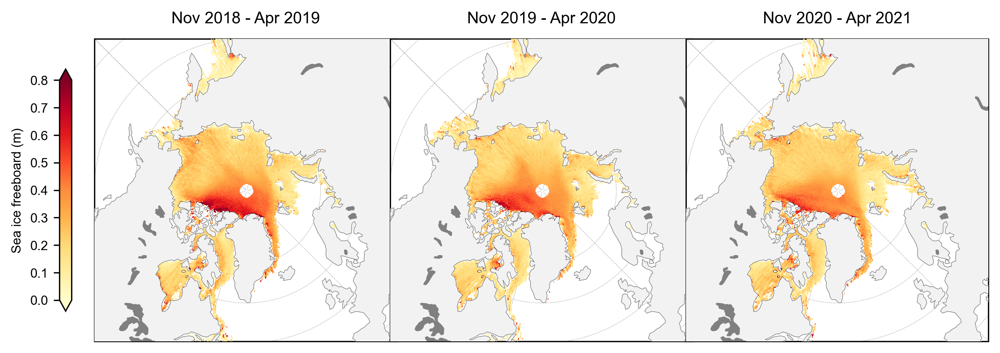

In [6]:
freeboard_winter_means = compute_gridcell_winter_means(book_ds.freeboard, years=years)
staticArcticMaps(freeboard_winter_means, dates=freeboard_winter_means.time.values, set_cbarlabel = "Sea ice freeboard (m)", cmap="YlOrRd", vmin=0, vmax=0.8, out_str='freeboard_winter')


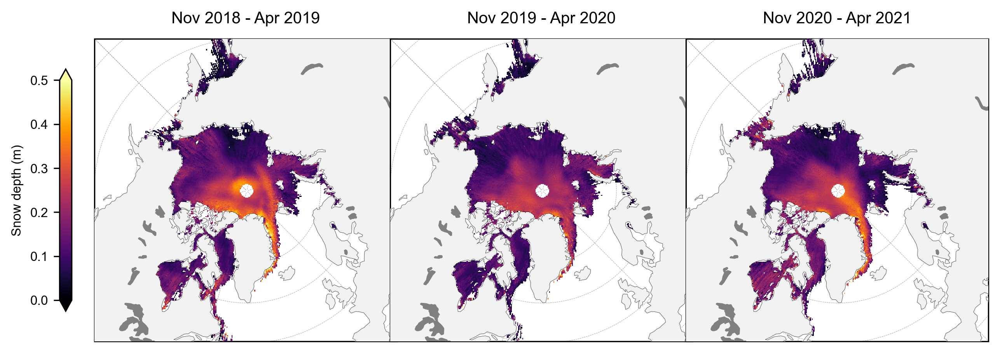

In [7]:
snow_depth_winter_means = compute_gridcell_winter_means(book_ds.snow_depth, years=years)
staticArcticMaps(snow_depth_winter_means, dates=snow_depth_winter_means.time.values, set_cbarlabel = "Snow depth (m)", cmap="inferno", vmin=0, vmax=0.5, out_str='snowdepth_winter')


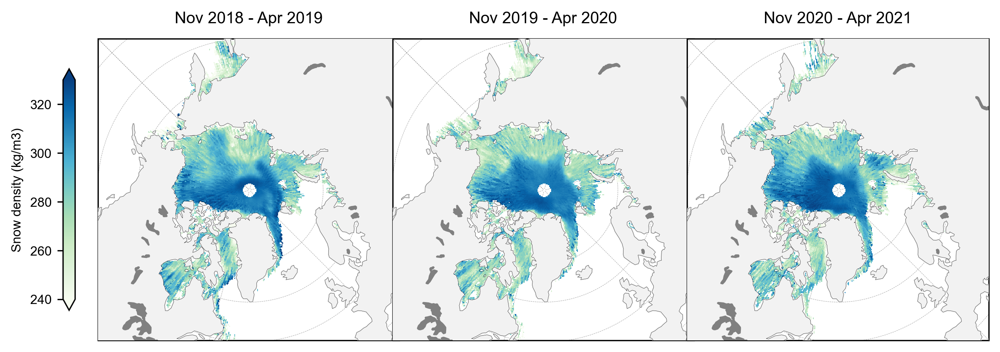

In [8]:
snow_density_winter_means = compute_gridcell_winter_means(book_ds.snow_density, years=years)
staticArcticMaps(snow_density_winter_means, dates=snow_depth_winter_means.time.values, set_cbarlabel = "Snow density (kg/m3)", cmap="GnBu", vmin=240, vmax=330, out_str='snowdensity_winter')

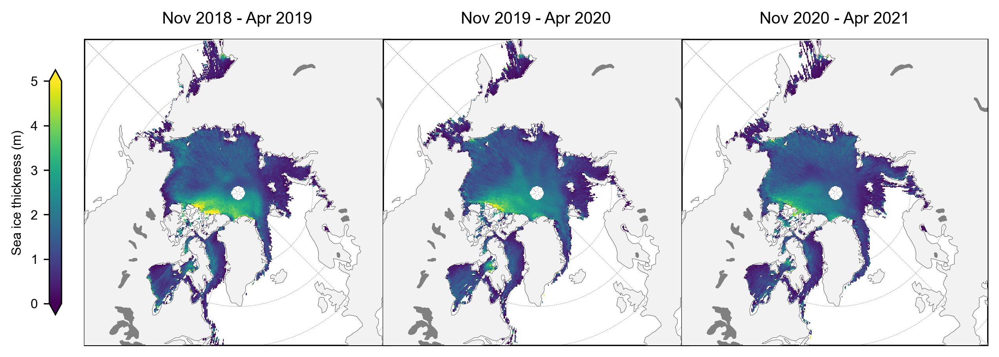

In [9]:
thickness_winter_means = compute_gridcell_winter_means(book_ds.ice_thickness, years=years)
staticArcticMaps(thickness_winter_means, dates=thickness_winter_means.time.values, title="", set_cbarlabel = "Sea ice thickness (m)", cmap="viridis", vmin=0, vmax=5, out_str='thickness_winter')


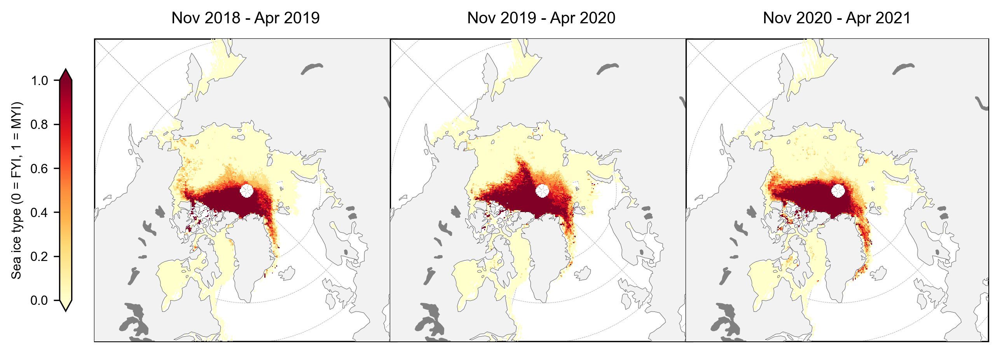

In [10]:
ice_type_winter_means = compute_gridcell_winter_means(book_ds.ice_type, years=years)
staticArcticMaps(ice_type_winter_means, dates=ice_type_winter_means.time.values, set_cbarlabel = "Sea ice type (0 = FYI, 1 = MYI)", cmap="YlOrRd", vmin=0, vmax=1, out_str='icetype_winter')


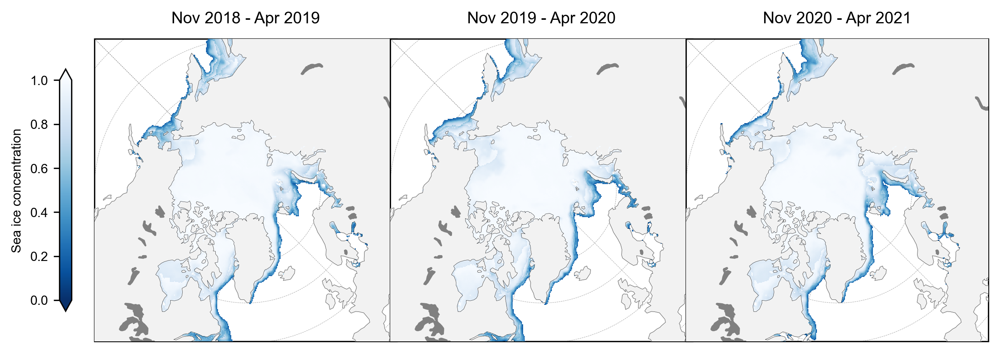

In [11]:
ice_conc_winter_means = compute_gridcell_winter_means(book_ds.sea_ice_conc, years=years)
staticArcticMaps(ice_conc_winter_means, dates=ice_conc_winter_means.time.values, set_cbarlabel = "Sea ice concentration", cmap="Blues_r", vmin=0, vmax=1, out_str='iceconc_winter')


# Overlay sea ice drift vectors 
We can use a modified version of the plotting function used above to overlay sea ice drift vectors on any variable of interest. Below, we'll generate the plot presented in Petty et al. (2022) that shows mean sea ice thickness and mean sea ice drift for the three winters. 

In [12]:
print(staticArcticMaps_overlayDrifts.__doc__)

 Show data on a basemap of the Arctic. Can be one month or multiple months of data. Overlay drift vectors on top 
    Creates an xarray facet grid. For more info, see: http://xarray.pydata.org/en/stable/user-guide/plotting.html
    
    Args: 
        da (xr DataArray): data to plot
        drifts_x (xr.DataArray): sea ice drifts along-x component of the ice motion
        drifts_y (xr.DataArray): sea ice drifts along-y component of the ice motion
        alpha (float 0-1, optional): Set this variable if you want da to have a reduced opacity (default to 1)
        res (int, optional): resolution of vectors (default to 6; plot 1 out of every 6 vectors)
        title (str, optional): title string for plot
        out_str (str, optional): output string when saving
        cmap (str, optional): colormap to use (default to viridis)
        col (str, optional): coordinate to use for creating facet plot (default to "time")
        col_wrap (int, optional): number of columns of plots to displa

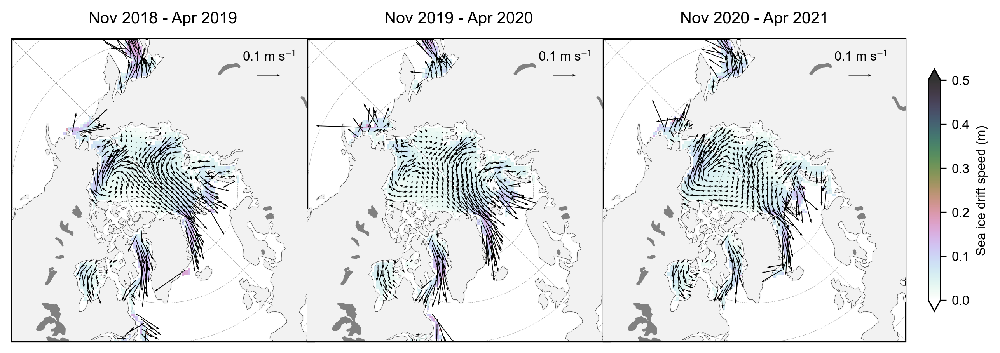

In [13]:
# Compute winter means 

drifts_xvel_winter_means = compute_gridcell_winter_means(book_ds.x_vel, years=years)
drifts_yvel_winter_means = compute_gridcell_winter_means(book_ds.y_vel, years=years)
drifts_mag_winter_means = compute_gridcell_winter_means(np.sqrt(book_ds.x_vel**2+book_ds.y_vel**2).rename('mag'), years=years)

# Generate plot 
staticArcticMaps_overlayDrifts(da=drifts_mag_winter_means,
                                           dates=drifts_mag_winter_means.time.values,
                                           drifts_x=drifts_xvel_winter_means, 
                                           drifts_y=drifts_yvel_winter_means, 
                                           set_cbarlabel="Sea ice drift speed (m)", cmap="cubehelix_r", 
                                           vmin=0, vmax=0.5, alpha=0.8, res = 6,
                                           out_str='driftmag_drifts_overlayed')

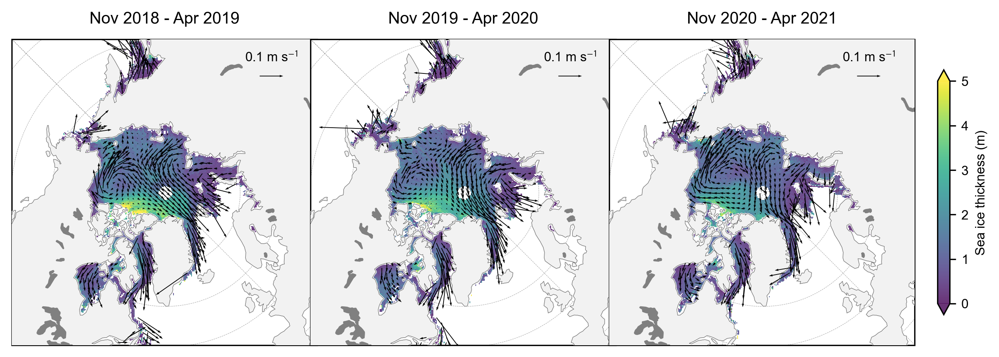

In [14]:
# Compute winter means 
thickness_winter_means = compute_gridcell_winter_means(book_ds.ice_thickness, years=years)
drifts_xvel_winter_means = compute_gridcell_winter_means(book_ds.x_vel, years=years)
drifts_yvel_winter_means = compute_gridcell_winter_means(book_ds.y_vel, years=years)

# Generate plot 
pl_drifts = staticArcticMaps_overlayDrifts(da=thickness_winter_means,
                                           dates=thickness_winter_means.time.values,
                                           drifts_x=drifts_xvel_winter_means, 
                                           drifts_y=drifts_yvel_winter_means, 
                                           set_cbarlabel="Sea ice thickness (m)", cmap="viridis", 
                                           vmin=0, vmax=5, alpha=0.8, 
                                           out_str='thickness_drifts_overlayed')
display(pl_drifts)

You can also plot the sea ice drifts for just a single month. Below, we'll show November sea ice drift overlayed on November sea ice freeboard for three winter seasons.

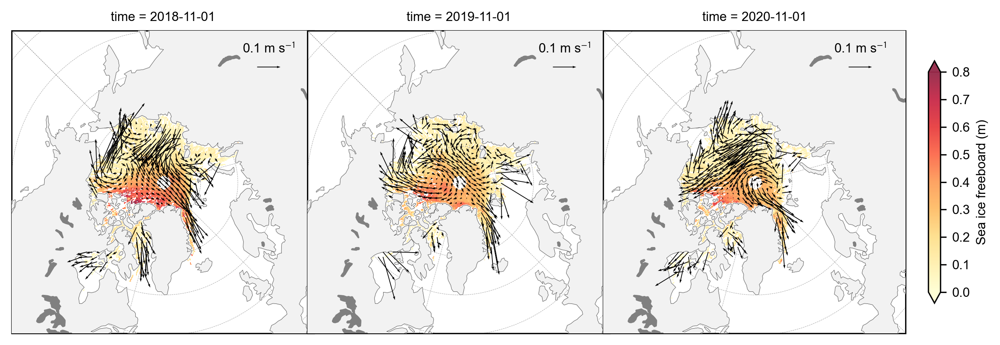

In [15]:
# Generate plot 
pl_drifts = staticArcticMaps_overlayDrifts(da=book_ds.freeboard.sel(time=["Nov 2018","Nov 2019","Nov 2020"]),
                                           drifts_x=book_ds.x_vel.sel(time=["Nov 2018","Nov 2019","Nov 2020"]), 
                                           drifts_y=book_ds.y_vel.sel(time=["Nov 2018","Nov 2019","Nov 2020"]), 
                                           set_cbarlabel="Sea ice freeboard (m)", cmap="YlOrRd", 
                                           vmin=0, vmax=0.8, alpha=0.8, 
                                           out_str='nov_freeboard_drifts_overlayed')
display(pl_drifts)

We can also change the resolution of the drifts to see more or less detail in the overlaid vectors. You can do this by changing the `res` argument, set to a default of 6. You also might want to change the opacity of the data to improve the visualization, which can be altered with the `alpha` argument. Setting `alpha=1` indicates you want full opacity, and less than 1 indicates for some degree of transparency. <br><br>
Below, we'll plot sea ice type with an alpha of 0.7 and a drift vector resoltion of 11 (display 1 out of every 11 vectors).

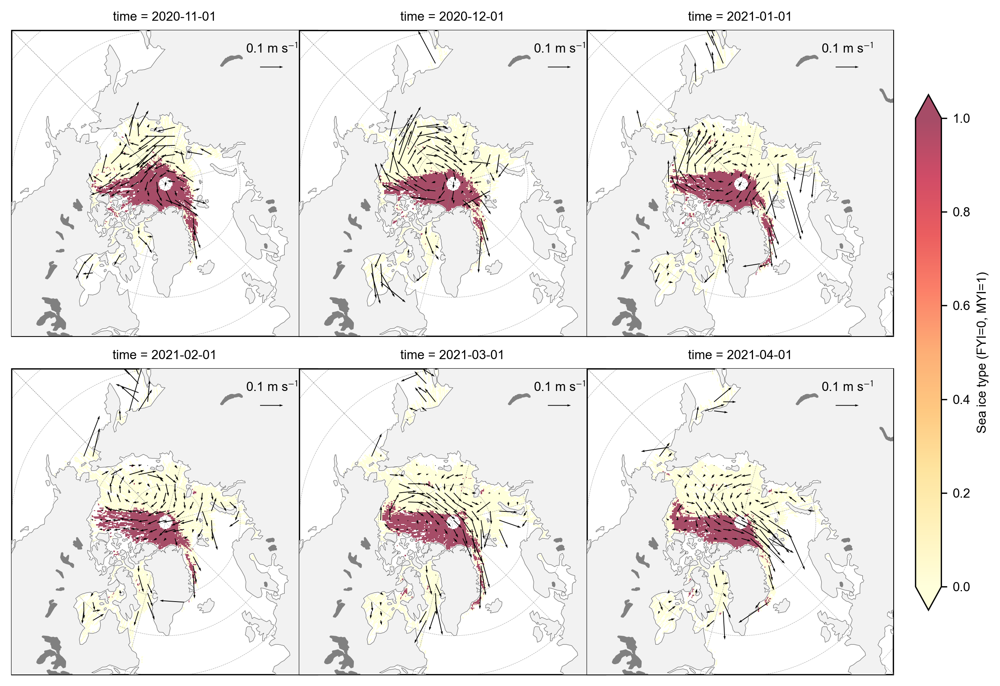

In [16]:
# Generate plot 
pl_drifts = staticArcticMaps_overlayDrifts(da=book_ds.ice_type.sel(time=slice("Nov 2020", "April 2021")),
                                           drifts_x=book_ds.x_vel.sel(time=slice("Nov 2020", "April 2021")), 
                                           drifts_y=book_ds.y_vel.sel(time=slice("Nov 2020", "April 2021")), 
                                           set_cbarlabel="Sea ice type (FYI=0, MYI=1)", cmap="YlOrRd", 
                                           vmin=0, vmax=1, alpha=0.7, res = 11,  
                                           out_str='ice_type_drifts_overlayed')
display(pl_drifts)

# Static monthly maps
Compute and map (static) data given variables across the three winters for individual months

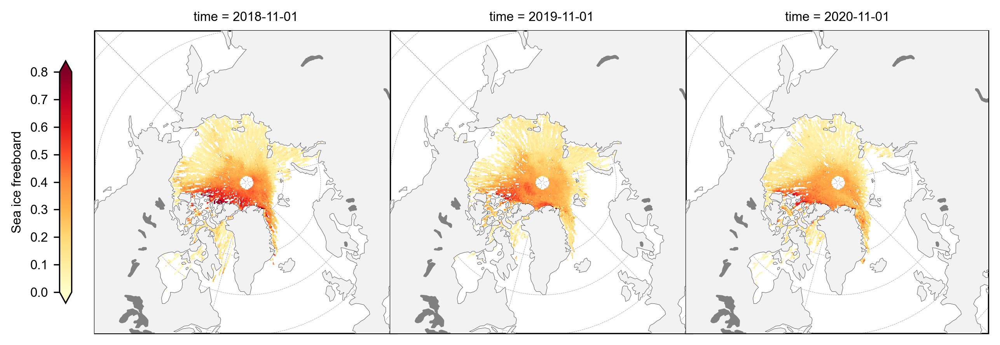

In [17]:
pl = staticArcticMaps(book_ds.freeboard.sel(time=["Nov 2018","Nov 2019","Nov 2020"]), set_cbarlabel = "Sea ice freeboard", cmap="YlOrRd", vmin=0, vmax=0.8, out_str='freeboard_november')
display(pl)

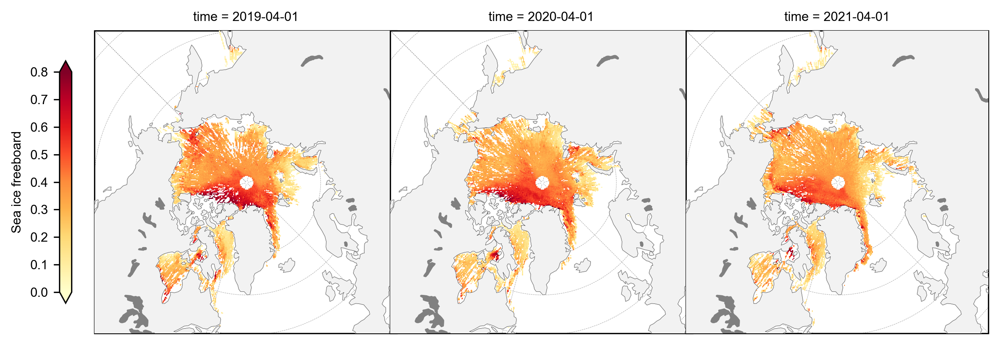

In [18]:
pl = staticArcticMaps(book_ds.freeboard.sel(time=["Apr 2019","Apr 2020","Apr 2021"]), set_cbarlabel = "Sea ice freeboard", cmap="YlOrRd", vmin=0, vmax=0.8, out_str='freeboard_april')
display(pl)

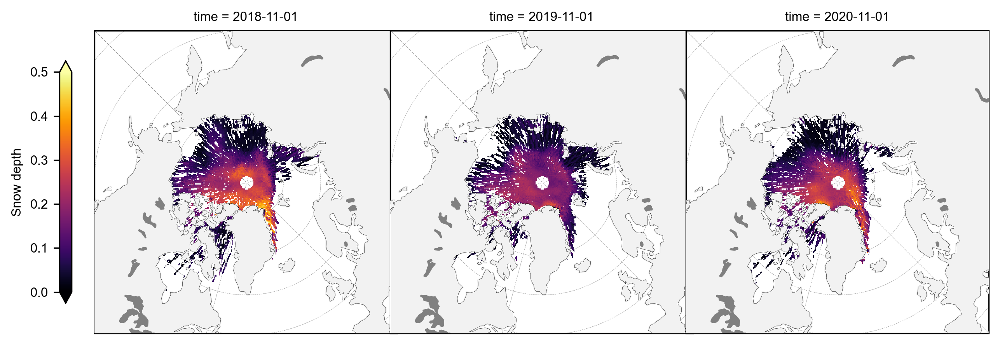

In [19]:
pl = staticArcticMaps(book_ds.snow_depth.sel(time=["Nov 2018","Nov 2019","Nov 2020"]), set_cbarlabel = "Snow depth", cmap="inferno", vmin=0, vmax=0.5, out_str='snowdepth_november')
display(pl)

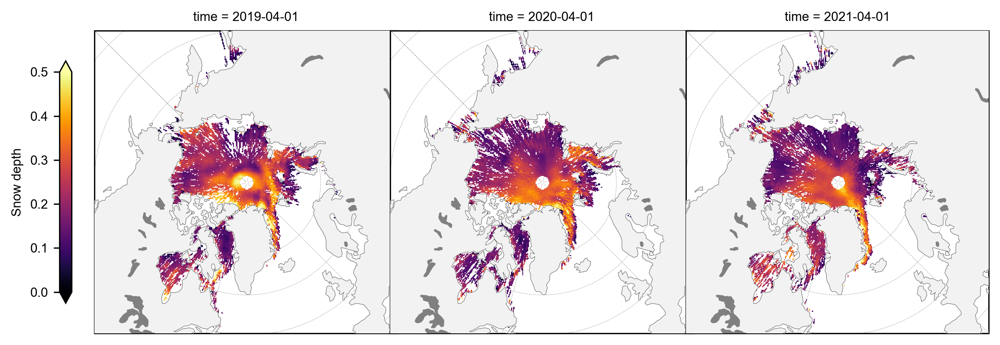

In [20]:
pl = staticArcticMaps(book_ds.snow_depth.sel(time=["Apr 2019","Apr 2020","Apr 2021"]), set_cbarlabel = "Snow depth", cmap="inferno", vmin=0, vmax=0.5, out_str='snowdepth_april')
display(pl)

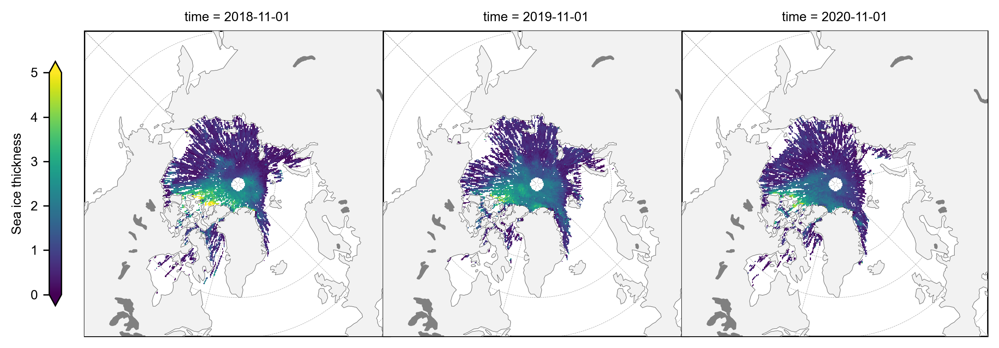

In [21]:
pl = staticArcticMaps(book_ds.ice_thickness.sel(time=["Nov 2018","Nov 2019","Nov 2020"]), set_cbarlabel = "Sea ice thickness", cmap="viridis", vmin=0, vmax=5, out_str='thickness_november')
display(pl)

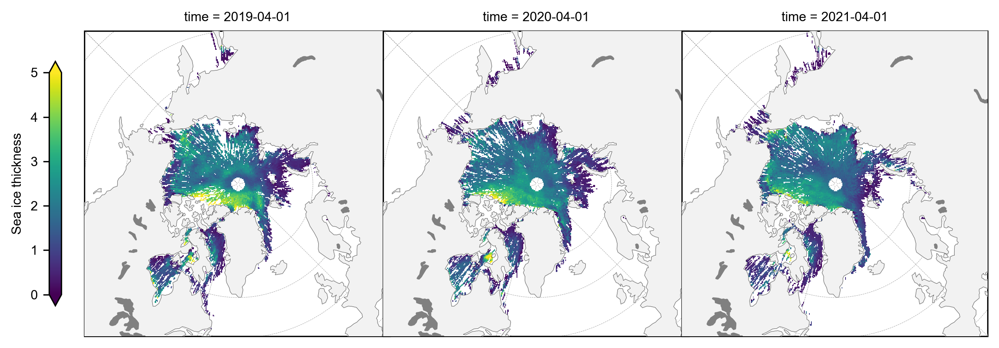

In [22]:
pl = staticArcticMaps(book_ds.ice_thickness.sel(time=["Apr 2019","Apr 2020","Apr 2021"]), set_cbarlabel = "Sea ice thickness", cmap="viridis", vmin=0, vmax=5, out_str='thickness_april')
display(pl)

# Thickness anomaly plots
Compute and map (static) monthly anomaly maps (relative to the mean across the three winters by default) for given variables across the three winters

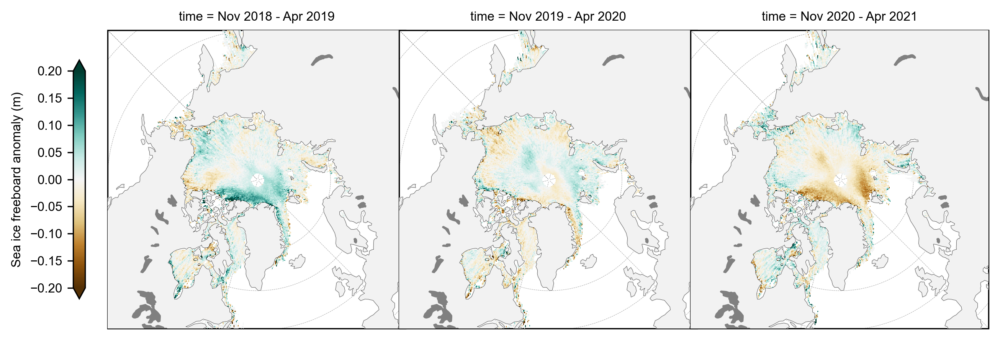

In [23]:
freeboard_winter_means = compute_gridcell_winter_means(book_ds.freeboard, years=years)
pl = staticArcticMaps(freeboard_winter_means-freeboard_winter_means.mean(axis=0), title="", set_cbarlabel = "Sea ice freeboard anomaly (m)", cmap="BrBG", vmin=-0.2, vmax=0.2, out_str='freeboard_winter_anomaly')
display(pl)

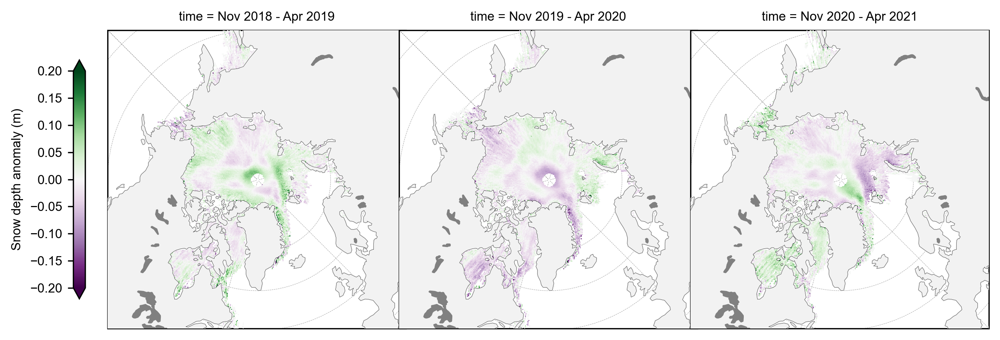

In [24]:
snow_depth_winter_means = compute_gridcell_winter_means(book_ds.snow_depth, years=years)
pl = staticArcticMaps(snow_depth_winter_means-snow_depth_winter_means.mean(axis=0), set_cbarlabel = "Snow depth anomaly (m)", cmap="PRGn", vmin=-0.2, vmax=0.2, out_str='snowdepth_winter_anomaly')
display(pl)

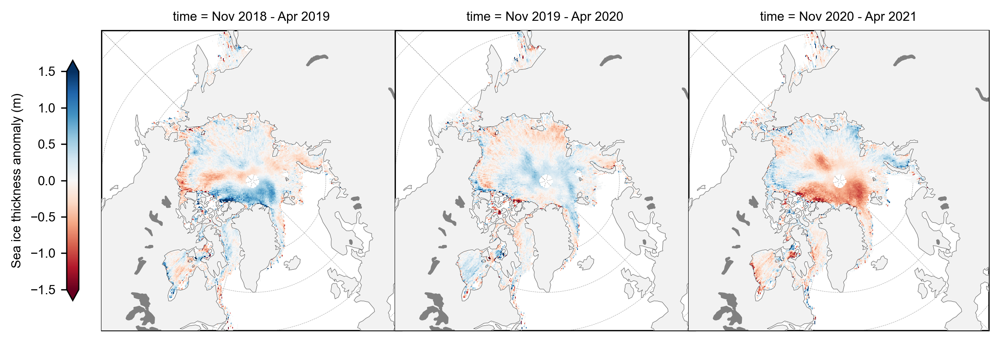

In [25]:
thickness_winter_means = compute_gridcell_winter_means(book_ds.ice_thickness, years=years)
pl = staticArcticMaps(thickness_winter_means-thickness_winter_means.mean(axis=0), set_cbarlabel = "Sea ice thickness anomaly (m)", cmap="RdBu", vmin=-1.5, vmax=1.5, out_str='thickness_winter_anomaly')
display(pl)

Do the same for the monthly anomalies (November then April)

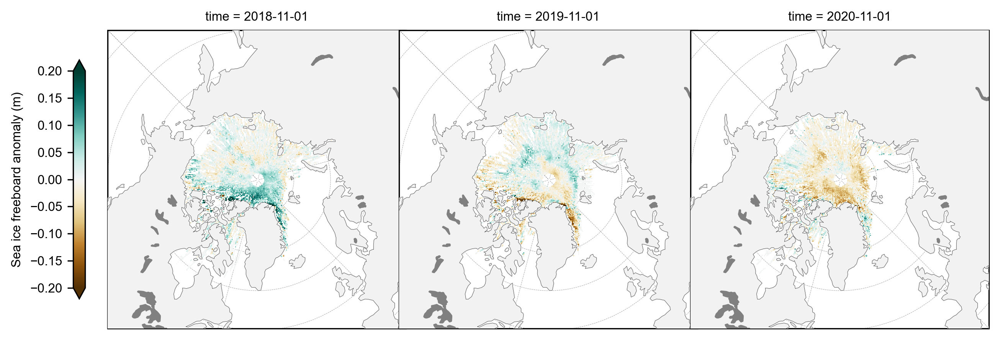

In [26]:
pl = staticArcticMaps(book_ds.freeboard[0::12]-book_ds.freeboard[0::12].mean(axis=0), set_cbarlabel = "Sea ice freeboard anomaly (m)", cmap="BrBG", vmin=-0.2, vmax=0.2, out_str='freeboard_november_anomaly')
display(pl)

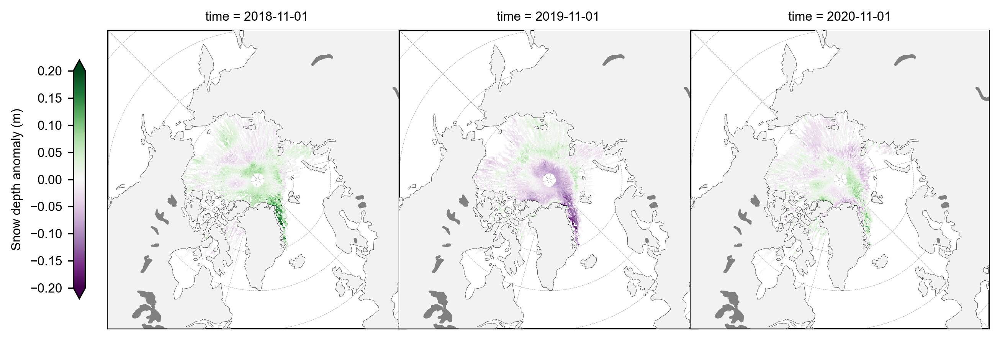

In [27]:
pl = staticArcticMaps(book_ds.snow_depth[0::12]-book_ds.snow_depth[0::12].mean(axis=0), set_cbarlabel = "Snow depth anomaly (m)", cmap="PRGn", vmin=-0.2, vmax=0.2, out_str='snow_depth_november_anomaly')
display(pl)

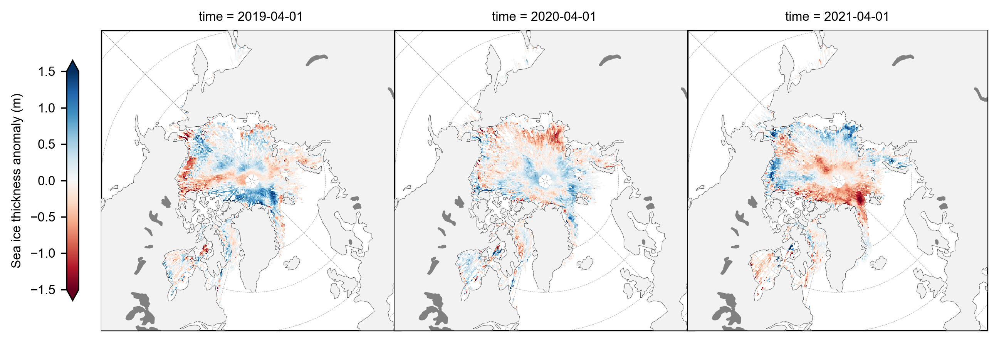

In [28]:
pl = staticArcticMaps(book_ds.ice_thickness[5::12]-book_ds.ice_thickness[5::12].mean(axis=0), set_cbarlabel = "Sea ice thickness anomaly (m)", cmap="RdBu", vmin=-1.5, vmax=1.5, out_str='thickness_november_anomaly')
display(pl)

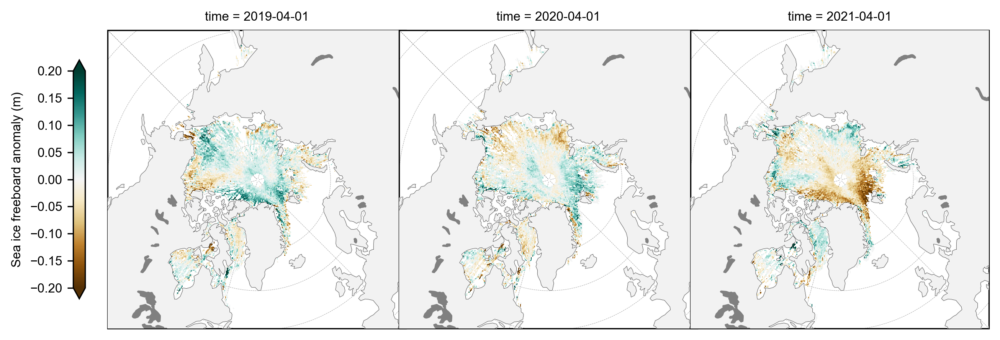

In [29]:
pl = staticArcticMaps(book_ds.freeboard[5::12]-book_ds.freeboard[5::12].mean(axis=0), set_cbarlabel = "Sea ice freeboard anomaly (m)", cmap="BrBG", vmin=-0.2, vmax=0.2, out_str='freeboard_april_anomaly')
display(pl)

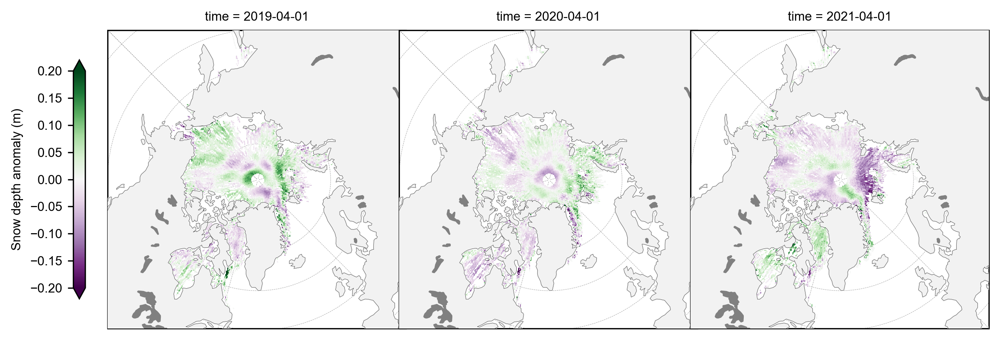

In [30]:
pl = staticArcticMaps(book_ds.snow_depth[5::12]-book_ds.snow_depth[5::12].mean(axis=0), set_cbarlabel = "Snow depth anomaly (m)", cmap="PRGn", vmin=-0.2, vmax=0.2, out_str='snow_depth_april_anomaly')
display(pl)

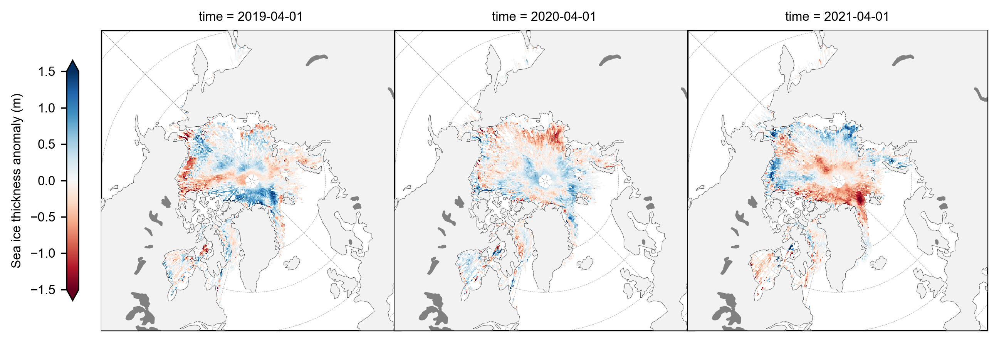

In [31]:
pl = staticArcticMaps(book_ds.ice_thickness[5::12]-book_ds.ice_thickness[5::12].mean(axis=0), set_cbarlabel = "Sea ice thickness anomaly (m)", cmap="RdBu", vmin=-1.5, vmax=1.5, out_str='thickness_april_anomaly')
display(pl)

# Monthly mean timeseries 
Next we'll compute monthly means by averaging over all gridcells within a given region. We'll use this to generate a lineplot to compare across the three winter seasons for each variable.

In [32]:
# Here is where we might also want to set a region mask, e.g. to avoid including some of the more uncertain data in the peripheral seas
innerArctic = [1,2,3,4,5,6]
book_ds_innerArctic = book_ds.where(book_ds.region_mask.isin(innerArctic))

# Uncomment out to set an additional ice type mask too and change the save_label accordingly (0 = FYI, 1 = MYI)
book_ds_innerArctic = book_ds_innerArctic.where(book_ds_innerArctic.ice_type==1)

save_label='Inner_Arctic_MYI'


In [33]:
print(static_winter_comparison_lineplot.__doc__) # Print docstring

 Make a lineplot with markers comparing monthly mean data across winter seasons 
    
    Args: 
        da (xr.DataArray): data to plot and compute mean for; must contain "time" as a coordinate 
        da_unc (xr.DataArray, optional): uncertainty data to plot as error bars
        years (list of str): list of years for which to plot data. 2020 would correspond to the winter season defined by start month 2020 - end month 2021 (default to all unique years in da)
        title (str, optional): title to give plot (default to no title) 
        set_ylabel (str, optional): prescribed y label string
        set_units (str, optional): prescribed y label unit string
        legend (bool): print legend
        savefig (bool): output figure
        save_label (str, optional): additional string for output
        figsize (tuple, optional): figure size to display in notebook (default to (5,3))
        start_month (str, optional): first month in winter (default to September)
        end_month (str

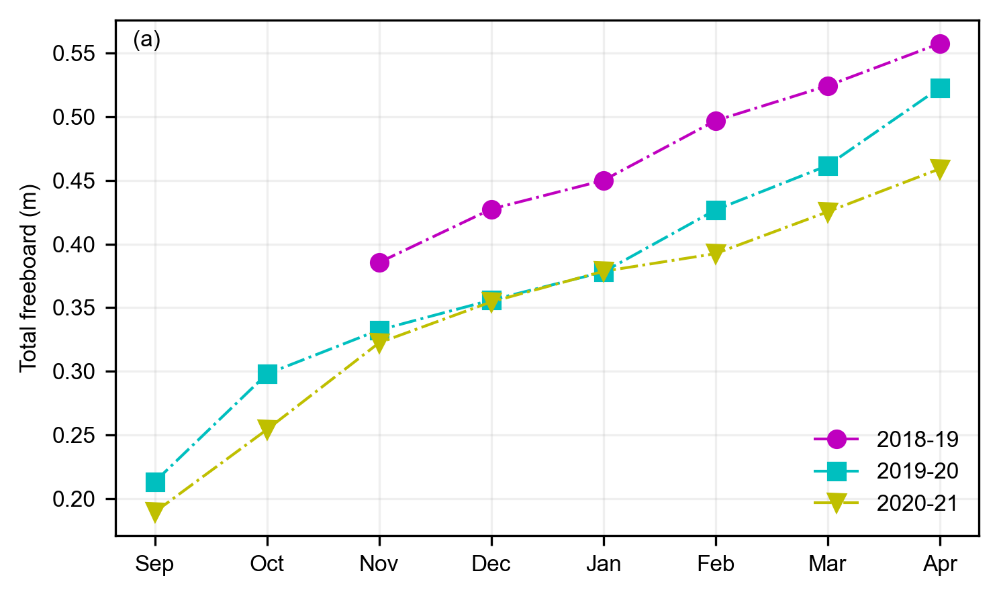

In [34]:
static_winter_comparison_lineplot(book_ds_innerArctic.freeboard, years=years, start_month="Sep", figsize=(5,3), annotation='(a)', set_ylabel=r'Total freeboard (m)', save_label=save_label, loc_pos=4, legend=True)

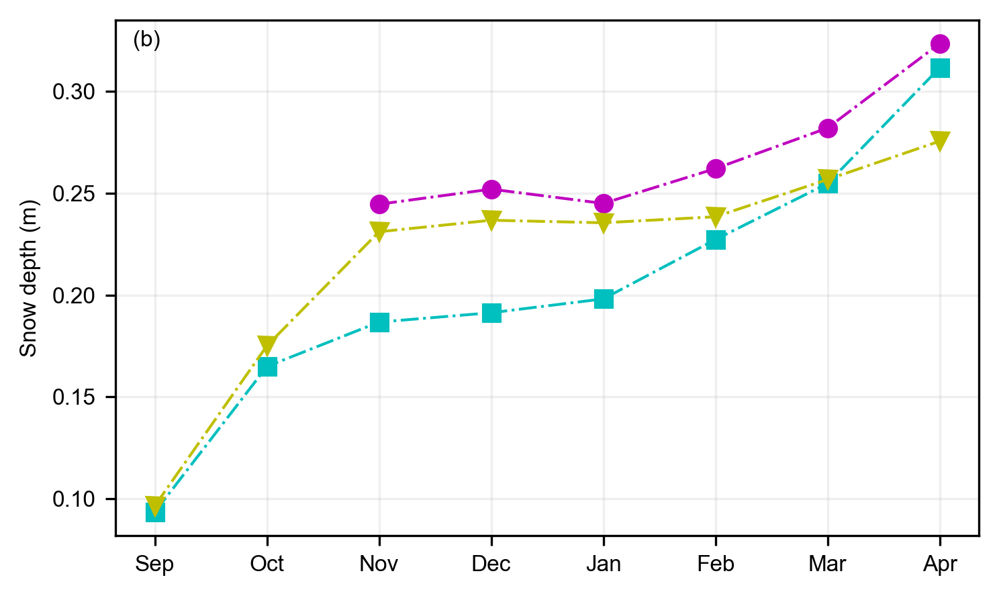

In [35]:
static_winter_comparison_lineplot(book_ds_innerArctic.snow_depth, years=years, start_month="Sep", figsize=(5,3), annotation='(b)',set_ylabel='Snow depth (m)', save_label=save_label, legend=False)

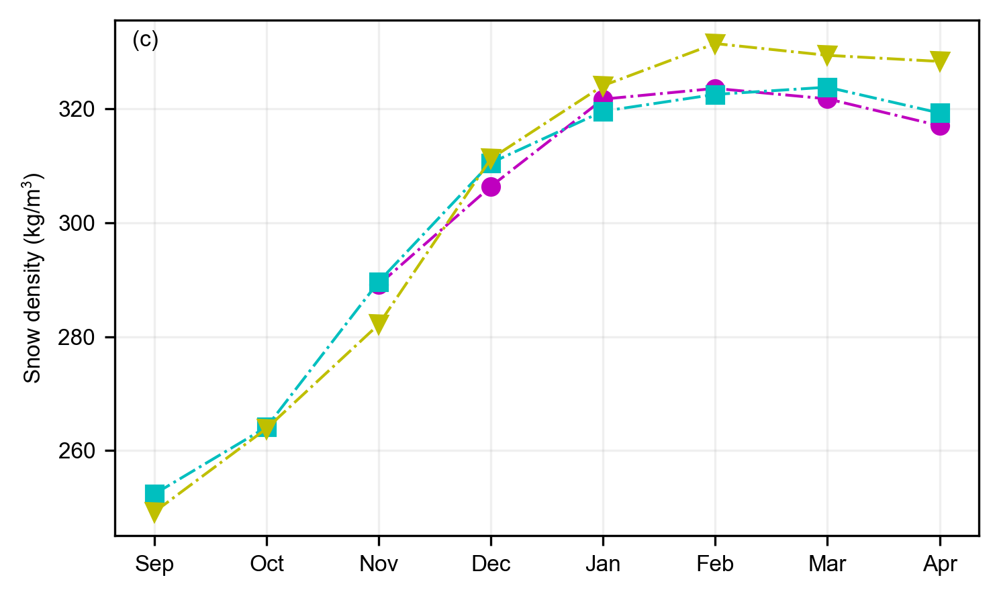

In [36]:
static_winter_comparison_lineplot(book_ds_innerArctic.snow_density, years=years, start_month="Sep", figsize=(5,3), annotation='(c)',set_ylabel=r'Snow density (kg/m$^3$)', save_label=save_label, legend=False)

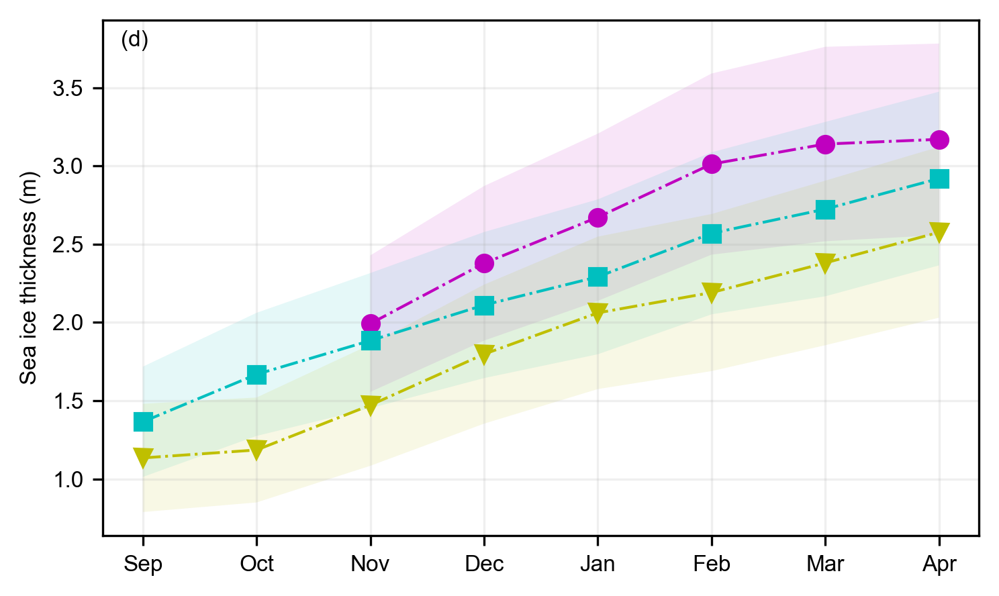

In [37]:
static_winter_comparison_lineplot(book_ds_innerArctic.ice_thickness, 
                                  da_unc = book_ds_innerArctic.ice_thickness_unc, 
                                  years=years, start_month="Sep", figsize=(5,3), set_ylabel='Sea ice thickness (m)', save_label=save_label, annotation='(d)', legend=False)

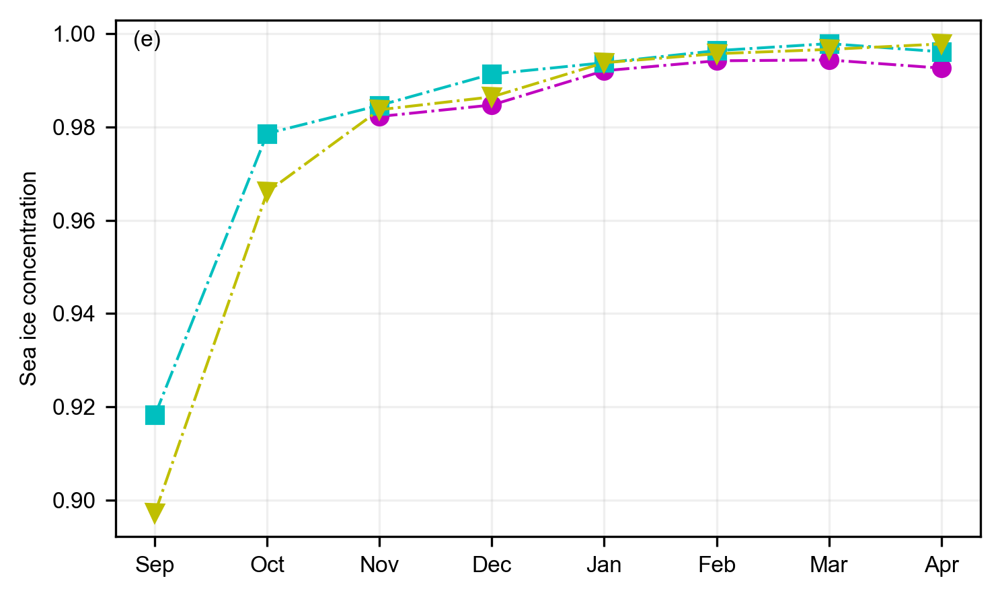

In [38]:
static_winter_comparison_lineplot(book_ds_innerArctic.sea_ice_conc, years=years, start_month="Sep", figsize=(5,3), annotation='(e)', set_ylabel='Sea ice concentration', save_label=save_label, legend=False)

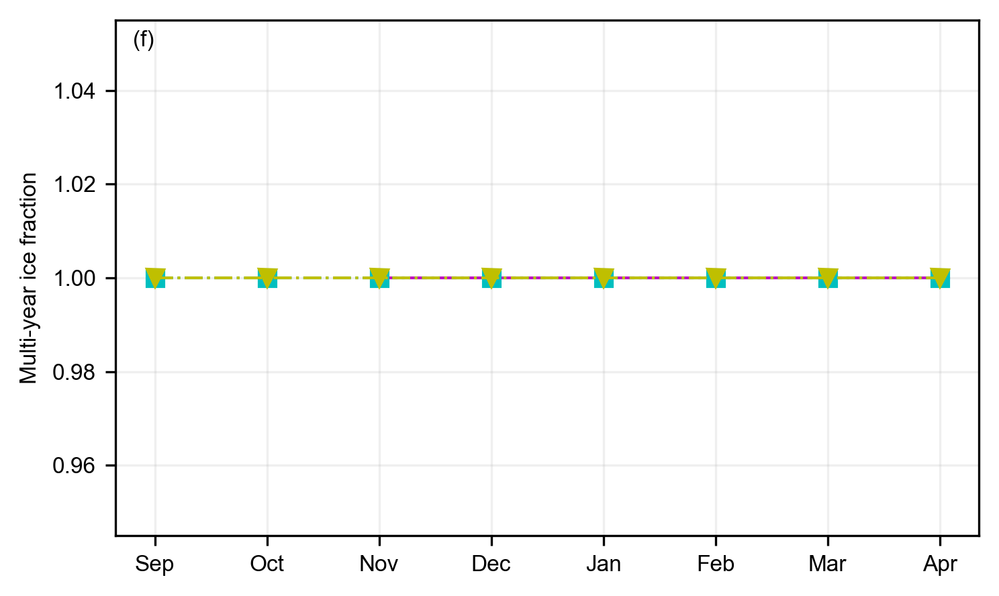

In [39]:
static_winter_comparison_lineplot(book_ds_innerArctic.ice_type, years=years, start_month="Sep", figsize=(5,3), annotation='(f)',set_ylabel='Multi-year ice fraction', save_label=save_label, legend=False)

Let's take things a bit further and set some conditions on the plots. Storing our data in an xarray dataset makes this very easy!

In [40]:
# Produce timeseries just using grid-cells of multi-year ice type (ice_type =1)
#static_winter_comparison_lineplot(out, title="Multiyear ice", years=years, figsize=(5,3), start_month="Nov", set_ylabel='Sea ice thickness (m)', save_label=save_label, legend=True)

In [41]:
# Produce timeseries just using grid-cells of first-year ice type (ice_type = 0)
# Use the flag at the start of this section to generate all plots based o the ice type classification
#out = book_ds_innerArctic.ice_thickness.where(book_ds_innerArctic.ice_type==0)
#static_winter_comparison_lineplot(out, years=years, figsize=(5,3), title="First-year ice", start_month="Nov", set_ylabel='Sea ice thickness (m)', save_label=save_label, legend=False)

Play around with some other conditions and see how things look!